## Credit Risk Assesment Hackathon

In [157]:

import csv
import pandas_profiling as pp
import datetime as dt

#Data Loading and Munging
import numpy as np
import pandas as pd

#Visualization
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe'
import matplotlib.pyplot as plt


#preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler


#Pipeline
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer

#Model
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

#Model Tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


In [158]:
data = pd.read_csv(r'c:\Users\Kanya\Documents\Python Scripts\.ipynb_checkpoints\Inceptez_hackathon\train_loan_data.csv')

In [159]:
test = pd.read_csv(r'c:\Users\Kanya\Documents\Python Scripts\.ipynb_checkpoints\Inceptez_hackathon\test_loan_data.csv')

In [160]:
data= data.append(test)

C:\Users\Kanya\AppData\Local\Temp\ipykernel_27132\4157683790.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [161]:
data1.shape

(100000, 28)

In [162]:
data.shape

(100000, 28)

In [163]:
data.describe()

,annual_inc,fico_range_high,fico_range_low,int_rate,loan_amnt,num_actv_bc_tl,mort_acc,tot_cur_bal,open_acc,pub_rec,pub_rec_bankruptcies,revol_bal,revol_util,total_acc
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,95041.000000,96525.000000,9.504100e+04,100000.000000,100000.000000,99958.000000,1.000000e+05,99934.000000,100000.000000
mean,7.613644e+04,700.031260,696.031100,13.238209,14408.428500,3.630517,1.673670,1.415093e+05,11.603230,0.214940,0.135827,1.626783e+04,51.861263,25.033960
std,7.265827e+04,31.741546,31.740792,4.771758,8725.405078,2.254231,2.000409,1.586730e+05,5.488242,0.577671,0.381407,2.250461e+04,24.505807,12.027108
min,0.000000e+00,664.000000,660.000000,5.310000,750.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000
25%,4.600000e+04,674.000000,670.000000,9.750000,7900.000000,2.000000,0.000000,2.963500e+04,8.000000,0.000000,0.000000,5.935000e+03,33.400000,16.000000
50%,6.500000e+04,694.000000,690.000000,12.740000,12000.000000,3.000000,1.000000,8.092800e+04,11.000000,0.000000,0.000000,1.110100e+04,52.200000,23.000000
75%,9.000000e+04,714.000000,710.000000,15.990000,20000.000000,5.000000,3.000000,2.108750e+05,14.000000,0.000000,0.000000,1.967500e+04,70.800000,32.000000
max,9.522972e+06,850.000000,845.000000,30.990000,40000.000000,32.000000,32.000000,5.172185e+06,80.000000,24.000000,8.000000,1.023940e+06,152.600000,162.000000


In [164]:
data.head(10)

,addr_state,annual_inc,earliest_cr_line,emp_length,emp_title,fico_range_high,fico_range_low,grade,home_ownership,application_type,...,pub_rec_bankruptcies,purpose,revol_bal,revol_util,sub_grade,term,title,total_acc,verification_status,loan_status
0,CO,85000.0,Jul-1997,10+ years,Deputy,744.0,740.0,E,MORTGAGE,Individual,...,0.0,debt_consolidation,5338.0,93.6,E1,60 months,Debt consolidation,8.0,Source Verified,Charged Off
1,CA,40000.0,Apr-1987,10+ years,Department of Veterans Affairs,724.0,720.0,B,RENT,Individual,...,0.0,debt_consolidation,19944.0,60.3,B1,36 months,Credit Loan,12.0,Verified,Fully Paid
2,FL,60000.0,Aug-2007,10+ years,Marble polishing,679.0,675.0,B,MORTGAGE,Individual,...,0.0,debt_consolidation,23199.0,88.5,B5,36 months,Debt consolidation,16.0,Source Verified,Fully Paid
3,IL,100742.0,Sep-1980,10+ years,printer,664.0,660.0,B,MORTGAGE,Individual,...,0.0,debt_consolidation,18425.0,69.0,B2,36 months,Debt consolidation,19.0,Source Verified,Fully Paid
4,MD,80000.0,Jul-1999,10+ years,Southern Mgmt,669.0,665.0,F,RENT,Individual,...,0.0,debt_consolidation,34370.0,90.0,F5,60 months,Debt Connsolidation,59.0,Verified,Fully Paid
5,CA,51488.0,May-1991,NaN,NaN,679.0,675.0,D,MORTGAGE,Individual,...,0.0,home_improvement,10747.0,53.9,D3,36 months,Home improvement,37.0,Verified,Fully Paid
6,NY,100000.0,Oct-1986,10+ years,RN,699.0,695.0,C,MORTGAGE,Individual,...,0.0,credit_card,32488.0,54.1,C1,36 months,Credit card refinancing,36.0,Verified,Fully Paid
7,PA,35028.0,Nov-1995,3 years,SHHC,679.0,675.0,C,RENT,Individual,...,0.0,debt_consolidation,13147.0,78.3,C4,36 months,Credit consolidation sought,19.0,Not Verified,Fully Paid
8,FL,59292.0,Dec-2007,NaN,NaN,664.0,660.0,B,MORTGAGE,Individual,...,0.0,debt_consolidation,1054.0,23.4,B4,36 months,NaN,23.0,Verified,Fully Paid
9,CA,65000.0,Jun-2004,< 1 year,Nurse,684.0,680.0,D,RENT,Individual,...,0.0,debt_consolidation,8991.0,64.7,D4,36 months,Debt consolidation,20.0,Source Verified,Fully Paid


### Check for Duplicates

In [165]:
data.duplicated().sum()

0

### Inference #1 : No any Duplicate Values Found

### Check for NA

In [166]:
data.isna().sum()

addr_state                  0
annual_inc                  0
earliest_cr_line            0
emp_length               5846
emp_title                6396
fico_range_high             0
fico_range_low              0
grade                       0
home_ownership              0
application_type            0
initial_list_status         0
int_rate                    0
loan_amnt                   0
num_actv_bc_tl           4959
mort_acc                 3475
tot_cur_bal              4959
open_acc                    0
pub_rec                     0
pub_rec_bankruptcies       42
purpose                     0
revol_bal                   0
revol_util                 66
sub_grade                   0
term                        0
title                    1217
total_acc                   0
verification_status         0
loan_status             20000
dtype: int64

### Found NA in Multiple Columns (To Apply Median , Mode for filling NA)

In [167]:
data['emp_length'].unique()

array(['10+ years', nan, '3 years', '< 1 year', '1 year', '8 years',
       '7 years', '4 years', '2 years', '5 years', '6 years', '9 years'],
      dtype=object)

In [168]:
data['emp_length'].replace({'10+ years'   : '10'
,'3 years'    : '3'
,'< 1 year'   : '0'
,'1 year'     : '1'
,'8 years'    : '8'
,'7 years'    : '7'
,'4 years'    : '4'
,'2 years'    : '2'
,'5 years'    : '5'
,'6 years'    : '6'
,'9 years'    : '9'}, inplace = True)

In [169]:
data['emp_length'].unique()

array(['10', nan, '3', '0', '1', '8', '7', '4', '2', '5', '6', '9'],
      dtype=object)

In [170]:
data['emp_length'].dtypes

dtype('O')

In [171]:
data['emp_length'] = data['emp_length'].fillna(data['emp_length'].mode()[0])

In [172]:
data['emp_length'].unique()

array(['10', '3', '0', '1', '8', '7', '4', '2', '5', '6', '9'],
      dtype=object)

In [173]:
data['emp_length'] = data['emp_length'].astype(int)

In [174]:
data['emp_length'].unique()

array([10,  3,  0,  1,  8,  7,  4,  2,  5,  6,  9])

In [175]:
data['emp_title'].value_counts()

Teacher                       1635
Manager                       1434
Owner                          734
Registered Nurse               659
RN                             656
                              ... 
DIETARY                          1
bankruptcy doc specialist        1
CK General Construction          1
Supervisor-Maintenance           1
rv technician                    1
Name: emp_title, Length: 44316, dtype: int64

### Title of the column has large number of values and looks it is not significant with the result data hence we are dropping the column from the dataset

In [176]:
data.drop(columns="emp_title",inplace=True)

In [177]:
data.columns

Index(['addr_state', 'annual_inc', 'earliest_cr_line', 'emp_length',
       'fico_range_high', 'fico_range_low', 'grade', 'home_ownership',
       'application_type', 'initial_list_status', 'int_rate', 'loan_amnt',
       'num_actv_bc_tl', 'mort_acc', 'tot_cur_bal', 'open_acc', 'pub_rec',
       'pub_rec_bankruptcies', 'purpose', 'revol_bal', 'revol_util',
       'sub_grade', 'term', 'title', 'total_acc', 'verification_status',
       'loan_status'],
      dtype='object')

In [178]:
data.isna().sum()

addr_state                  0
annual_inc                  0
earliest_cr_line            0
emp_length                  0
fico_range_high             0
fico_range_low              0
grade                       0
home_ownership              0
application_type            0
initial_list_status         0
int_rate                    0
loan_amnt                   0
num_actv_bc_tl           4959
mort_acc                 3475
tot_cur_bal              4959
open_acc                    0
pub_rec                     0
pub_rec_bankruptcies       42
purpose                     0
revol_bal                   0
revol_util                 66
sub_grade                   0
term                        0
title                    1217
total_acc                   0
verification_status         0
loan_status             20000
dtype: int64

In [179]:
data['num_actv_bc_tl'].value_counts()

3.0     20224
2.0     19667
4.0     15685
1.0     11019
5.0     10575
6.0      6489
7.0      3753
8.0      2204
0.0      2051
9.0      1353
10.0      813
11.0      484
12.0      277
13.0      178
14.0       96
15.0       56
16.0       37
17.0       28
18.0       19
19.0       12
21.0        6
20.0        4
22.0        4
26.0        3
25.0        1
24.0        1
27.0        1
32.0        1
Name: num_actv_bc_tl, dtype: int64

### To fill na for column No. of Active Banks we can go with group by emp_length and then take the mean to arrive at the No. of Active Cards

In [180]:
data['num_actv_bc_tl'] = data.groupby(['emp_length'])['num_actv_bc_tl'].transform(lambda x : x.fillna(x.mean()))


In [181]:
data['num_actv_bc_tl'].dtypes

dtype('float64')

In [182]:
data['num_actv_bc_tl'] = data['num_actv_bc_tl'].round(0).astype(int)

In [183]:
data['num_actv_bc_tl'].value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         4
2         4
3         4
4        14
         ..
19995     1
19996     2
19997     2
19998     1
19999     6
Name: num_actv_bc_tl, Length: 100000, dtype: int32>

In [184]:
data['mort_acc'] = data.groupby(['emp_length'])['mort_acc'].transform(lambda x : x.fillna(x.mean()))

In [185]:
data['mort_acc'].value_counts


<bound method IndexOpsMixin.value_counts of 0        1.0
1        0.0
2        2.0
3        1.0
4        7.0
        ... 
19995    0.0
19996    5.0
19997    4.0
19998    0.0
19999    0.0
Name: mort_acc, Length: 100000, dtype: float64>

In [186]:
data['num_actv_bc_tl'] = data['num_actv_bc_tl'].round(0).astype(int)

In [187]:
data['tot_cur_bal'] = data.groupby(['emp_length'])['tot_cur_bal'].transform(lambda x : x.fillna(x.mean()))

In [188]:
data['pub_rec_bankruptcies'] = data['pub_rec_bankruptcies'].fillna(data['pub_rec_bankruptcies'].mode()[0]) 

In [189]:

data['revol_util'] = data.groupby(['emp_length'])['revol_util'].transform(lambda x : x.fillna(x.mean()))


In [190]:
data['title'] = data['title'].fillna(data['title'].mode()[0])   

## Now we could see the data is clean without any NA and Duplicates

In [191]:
data.columns

Index(['addr_state', 'annual_inc', 'earliest_cr_line', 'emp_length',
       'fico_range_high', 'fico_range_low', 'grade', 'home_ownership',
       'application_type', 'initial_list_status', 'int_rate', 'loan_amnt',
       'num_actv_bc_tl', 'mort_acc', 'tot_cur_bal', 'open_acc', 'pub_rec',
       'pub_rec_bankruptcies', 'purpose', 'revol_bal', 'revol_util',
       'sub_grade', 'term', 'title', 'total_acc', 'verification_status',
       'loan_status'],
      dtype='object')

In [192]:
data['loan_status'].value_counts()

Fully Paid     64030
Charged Off    15970
Name: loan_status, dtype: int64

# Exploratory Data Analysis

<AxesSubplot:xlabel='loan_status', ylabel='Count'>

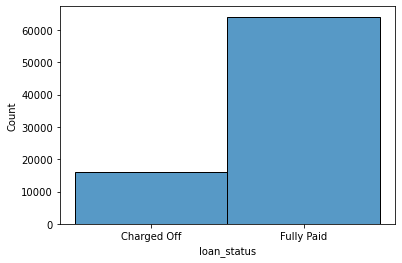

In [193]:
sns.histplot(data['loan_status'])

## Inference Data looks imbalanced w.r.t. Result Data 

<AxesSubplot:xlabel='verification_status', ylabel='Count'>

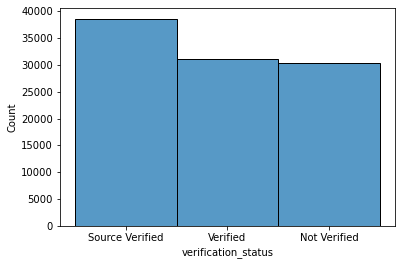

In [194]:
sns.histplot(data['verification_status'])

<AxesSubplot:xlabel='term', ylabel='Count'>

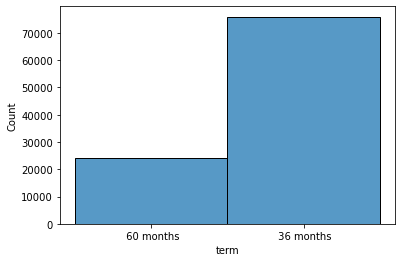

In [195]:
sns.histplot(data['term'])

<AxesSubplot:xlabel='grade', ylabel='Count'>

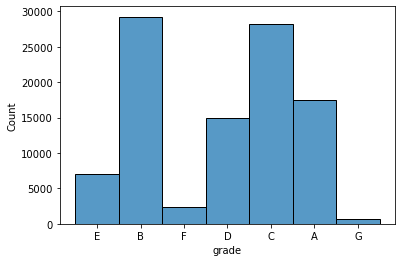

In [196]:
sns.histplot(data['grade'])

<AxesSubplot:xlabel='application_type', ylabel='Count'>

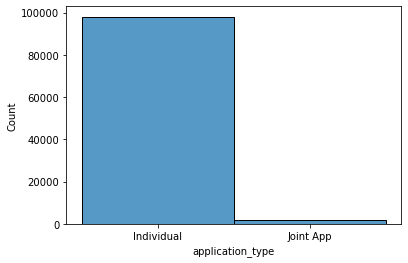

In [197]:
sns.histplot(data['application_type']) 

## BiVariate Analysis to understand more about the data 

In [198]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [199]:
data["title"].value_counts()

Debt consolidation                         50468
Credit card refinancing                    18447
Home improvement                            5648
Other                                       5078
Major purchase                              1792
                                           ...  
benefit                                        1
Light at the End of the Tunnel                 1
Best Deal for Credit Card Consolidation        1
Credit and car                                 1
Repurpose                                      1
Name: title, Length: 6506, dtype: int64

In [200]:
data.drop(columns="title",inplace=True)

In [201]:
data.drop(columns="addr_state",inplace=True)

In [202]:
data['earliest_cr_line'].value_counts()

Oct-2001    701
Aug-2001    686
Sep-2003    683
Sep-2004    680
Sep-2002    668
           ... 
Jul-2015      1
May-1959      1
Nov-1961      1
Jun-2015      1
Dec-1959      1
Name: earliest_cr_line, Length: 644, dtype: int64

In [203]:
data['new_earliest_cr_line'] =pd.to_datetime(data["earliest_cr_line"])

In [204]:
data['new_earliest_cr_line'].dtypes

dtype('<M8[ns]')

In [205]:
data['months'] = (pd.to_datetime('today') - data['new_earliest_cr_line'])/np.timedelta64(1, 'M')

In [206]:
data['months']

0        315.699805
1        438.708491
2        194.695267
3        517.658777
4        291.715739
            ...    
19995    157.667812
19996    298.680975
19997    329.695985
19998    247.723050
19999    354.698552
Name: months, Length: 100000, dtype: float64

In [207]:
data.drop(columns="new_earliest_cr_line",inplace=True)

In [208]:
data.drop(columns="earliest_cr_line",inplace=True)

In [209]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 19999
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   annual_inc            100000 non-null  float64
 1   emp_length            100000 non-null  int32  
 2   fico_range_high       100000 non-null  float64
 3   fico_range_low        100000 non-null  float64
 4   grade                 100000 non-null  object 
 5   home_ownership        100000 non-null  object 
 6   application_type      100000 non-null  object 
 7   initial_list_status   100000 non-null  object 
 8   int_rate              100000 non-null  float64
 9   loan_amnt             100000 non-null  float64
 10  num_actv_bc_tl        100000 non-null  int32  
 11  mort_acc              100000 non-null  float64
 12  tot_cur_bal           100000 non-null  float64
 13  open_acc              100000 non-null  float64
 14  pub_rec               100000 non-null  float64
 15  p

In [210]:
class CustomTranformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    def fit(self, X,y = None):
        return self
    def transform(self, X, y = None):
        return X

In [211]:
custom_pipleline = Pipeline([
    ('Custom_category_convert_from_numerical_data',CustomTranformer()),
])

In [212]:
numerical_ = Pipeline([
    ('imputation',SimpleImputer(strategy='mean')),
    ('scale', StandardScaler())
])


In [213]:
categorical_ = Pipeline([
    ('imputation',SimpleImputer(strategy='most_frequent')),
    ('encode', OneHotEncoder(sparse=False, handle_unknown='ignore'))
])

In [214]:
category_ = Pipeline([
   ('ColumnTransform',custom_pipleline),
   ('categorical', categorical_)
])

In [215]:
preprocess_full = ColumnTransformer(
    transformers=
    [
    ('numerical',numerical_, [  
                        'annual_inc'            
                        ,'emp_length'            
                        ,'fico_range_high'       
                        ,'fico_range_low'        
                        ,'int_rate'              
                        ,'loan_amnt'             
                        ,'num_actv_bc_tl'        
                        ,'mort_acc'              
                        ,'tot_cur_bal'           
                        ,'open_acc'              
                        ,'pub_rec'               
                        ,'pub_rec_bankruptcies'  
                        ,'revol_bal'             
                        ,'revol_util'            
                        ,'total_acc'             
                        ,'months'   ]),
    ('categorical', category_, 
     [ 'grade'              
        ,'home_ownership'     
        ,'application_type'   
        ,'initial_list_status'
        ,'purpose'            
        ,'sub_grade'          
        ,'term'               
        ,'verification_status'
        ])    
])

In [216]:
pipe_model = Pipeline([
    ('preprocess',preprocess_full),
    ('model', DecisionTreeClassifier())
])

In [217]:
test = data[data["loan_status"].isna()]

In [218]:
test = test.drop(columns = "loan_status")

In [219]:
data = data[data["loan_status"].notna()]

In [220]:
data.shape

(80000, 25)

In [221]:
X = data.drop(columns = "loan_status")
y = data['loan_status']

In [222]:
from sklearn import set_config
set_config(display='diagram')
display(pipe_model)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer()),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  ['annual_inc', 'emp_length',
                                                   'fico_range_high',
                                                   'fico_range_low', 'int_rate',
                                                   'loan_amnt',
                                                   'num_actv_bc_tl', 'mort_acc',
                                                   'tot_cur_bal', 'open_acc',
                                                   'pub_rec',
                                                   'pub_rec_bankruptcies',
                                                   'revol_bal', 'revol_util',
                                                   'to...
                                                                   Pipeline(steps=[('Custom_category_convert_from_numerical_data',
                                                                                    CustomTranformer())])),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('imputation',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('encode',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse=False))]))]),
                                                  ['grade', 'home_ownership',
                                                   'application_type',
                                                   'initial_list_status',
                                                   'purpose', 'sub_grade',
                                                   'term',
                                                   'verification_status'])])),
                ('model', DecisionTreeClassifier())])

In [223]:
pipe_model.fit(X,y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputation',
                                                                   SimpleImputer()),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  ['annual_inc', 'emp_length',
                                                   'fico_range_high',
                                                   'fico_range_low', 'int_rate',
                                                   'loan_amnt',
                                                   'num_actv_bc_tl', 'mort_acc',
                                                   'tot_cur_bal', 'open_acc',
                                                   'pub_rec',
                                                   'pub_rec_bankruptcies',
                                                   'revol_bal', 'revol_util',
                                                   'to...
                                                                   Pipeline(steps=[('Custom_category_convert_from_numerical_data',
                                                                                    CustomTranformer())])),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('imputation',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('encode',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse=False))]))]),
                                                  ['grade', 'home_ownership',
                                                   'application_type',
                                                   'initial_list_status',
                                                   'purpose', 'sub_grade',
                                                   'term',
                                                   'verification_status'])])),
                ('model', DecisionTreeClassifier())])

In [248]:
test_predict = pipe_model.predict(test)

In [249]:
test_predict.shape

(20000,)

In [250]:
actual_result = pd.read_csv(r'c:\Users\Kanya\Documents\Python Scripts\.ipynb_checkpoints\Inceptez_hackathon\test_results.csv')

In [251]:
actual_result

,loan_status
0,Fully Paid
1,Fully Paid
2,Fully Paid
3,Charged Off
4,Fully Paid
...,...
19995,Fully Paid
19996,Fully Paid
19997,Fully Paid
19998,Fully Paid


In [258]:
test_predict

array(['Fully Paid', 'Fully Paid', 'Fully Paid', ..., 'Fully Paid',
       'Fully Paid', 'Charged Off'], dtype=object)

In [259]:
df_predicted_result= pd.DataFrame(test_predict)

In [278]:
df_predicted_result.to_csv('Prediction_Using_Decision_Tree.csv', index=False)

In [262]:
df_predicted_result.value_counts()

Fully Paid     15501
Charged Off     4499
dtype: int64

In [268]:
df_predicted_result[0]

0         Fully Paid
1         Fully Paid
2         Fully Paid
3         Fully Paid
4         Fully Paid
            ...     
19995     Fully Paid
19996     Fully Paid
19997     Fully Paid
19998     Fully Paid
19999    Charged Off
Name: 0, Length: 20000, dtype: object

In [263]:
actual_result.value_counts()

loan_status
Fully Paid     16007
Charged Off     3993
dtype: int64

In [272]:
master_df = actual_result["loan_status"] +  df_predicted_result[0]

In [274]:
master_df

0         Fully PaidFully Paid
1         Fully PaidFully Paid
2         Fully PaidFully Paid
3        Charged OffFully Paid
4         Fully PaidFully Paid
                 ...          
19995     Fully PaidFully Paid
19996     Fully PaidFully Paid
19997     Fully PaidFully Paid
19998     Fully PaidFully Paid
19999    Fully PaidCharged Off
Length: 20000, dtype: object